In [1]:
# Run this cell to install DiffeRT and its dependencies, e.g., on Google Colab

try:
    import differt  # noqa: F401
except ImportError:
    import sys  # noqa: F401

    !{sys.executable} -m pip install differt[all] e3x jax_tqdm

# Radio Coverage Map from Generative Sampling-Assisted Ray Tracing

:::{warning}
The content of this notebook is not yet ready to be published.
:::

This notebook aims at being a tutorial to reproduce the results presented in the paper
*Comparing Differentiable and Dynamic Ray
Tracing: Introducing the Multipath Lifetime Map* {cite}`mlm-eucap2025`,
and assumes you are familiar with its content.

**You can run it locally or with Google Colab** by cliking on the rocket
at the top of this page!

:::{tip}
On Google Colab, make sure to select a GPU or TPU runtime for a faster experience.
:::

If you find this tutorial useful and plan on using this tool for your publications,
please cite our work, see {ref}`citing`.

## Summary

In our work, we present the Multipath Lifetime Map (MLM), a visual tool, along with two metrics,
to help determining the scope of application of the Dynamic Ray Tracing (RT) method. For further details, please refer to the paper.

:::{important}
The below implementation is far from being the most efficient, as it first aims at providing a nice visual output,
and it is tailored for users moving on a 2D grid.

While our method extends to any number and kind of dynamic objects,
it may become extremily hard to provide a visual representation of the MLM,
especially for higher dimensions.
:::

## Imports

As our code includes some non-trivial plots, we need to import quite a few Python modules.
All of them should be installed with `differt[all]`.

In [2]:
import sys

sys.executable

'/export/home/eertmans/repositories/DiffeRT/DiffeRT/.venv/bin/python'

In [3]:
import importlib

importlib.util.find_spec("numpy")

ModuleSpec(name='numpy', loader=<_frozen_importlib_external.SourceFileLoader object at 0x777108d75e50>, origin='/export/home/eertmans/repositories/DiffeRT/DiffeRT/.venv/lib/python3.11/site-packages/numpy/__init__.py', submodule_search_locations=['/export/home/eertmans/repositories/DiffeRT/DiffeRT/.venv/lib/python3.11/site-packages/numpy'])

In [4]:
from differt_core import __version__
__version__

'0.0.30'

In [5]:
import hashlib
import random
import urllib.request
from collections.abc import Iterator
from functools import partial
from typing import Any

import e3x
import equinox as eqx
import flax.linen as nn
import jax
import jax.numpy as jnp
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from beartype import beartype as typechecker
from jaxtyping import Array, Bool, Float, Int, PRNGKeyArray, PyTree, jaxtyped
from jax_tqdm import scan_tqdm
from plotly.colors import convert_to_RGB_255
from plotly.subplots import make_subplots
from tqdm.notebook import tqdm, trange

from differt.geometry import (
    TriangleMesh,
    merge_cell_ids,
    min_distance_between_cells,
    path_lengths,
)
from differt.plotting import draw_image, draw_markers, reuse, set_defaults
from differt.scene import (
    TriangleScene,
    download_sionna_scenes,
    get_sionna_scene,
)
from differt.utils import sample_points_in_bounding_box

import hashlib
import random

import equinox as eqx
import jax.numpy as jnp
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from jaxtyping import Array, Bool, Int
from plotly.colors import convert_to_RGB_255
from plotly.subplots import make_subplots

from differt.em import (
    Dipole,
    materials,
    pointing_vector,
    reflection_coefficients,
    sp_directions,
)
from differt.geometry import (
    TriangleMesh,
    merge_cell_ids,
    min_distance_between_cells,
    normalize,
)
from differt.plotting import draw_image, draw_markers, reuse, set_defaults
from differt.scene import (
    TriangleScene,
    download_sionna_scenes,
    get_sionna_scene,
)
from differt.utils import dot

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


## Simple Urban Street Canyon Scenario

Street canyons are probably one of the most common types of scenarios studied in RT,
due to their simplicity to model, but also important presence in big cities.

As we provide a compatibility layer with Sionna scenes {cite}`sionna`,
we will simply load the `'simple_street_canyon'` scene.

You can download all the scenes from the Sionna repository with
{func}`download_sionna_scenes<differt.scene.download_sionna_scenes>`.
By default, they will be placed in a subfolder of the `differt` Python module.

In [6]:
download_sionna_scenes()  # Let's download Sionna scenes (from the main branch)

In [7]:
set_defaults(
    "plotly"
)  # Our scene is simple, and Plotly is the best backend for online interactive plots :-)

use_box = False  # Set this to 'True' to work on an even simpler scene

if use_box:
    mesh = TriangleMesh.box(length=10.0, width=4.0, height=3.0)
    base_scene = TriangleScene(mesh=mesh)
else:
    file = get_sionna_scene("simple_street_canyon")
    base_scene = TriangleScene.load_xml(file)

sample_quads = (
    False  # You can set this to 'True' to sample quadrilaterals faces instead
)
# Otherwise, triangular faces are sampled
base_scene = base_scene.set_assume_quads(sample_quads)
base_scene.plot()

In the cell below (hidden by default), we define quite a few utility functions to
get nice plots, but this code is not needed if you are only interested in the metrics,
and not the visual output.

In [8]:
def hashfun(*objects: bytes) -> bytes:
    m = hashlib.sha256()

    for obj in objects:
        m.update(obj)

    return m.digest()


def get_cell_hashes(
    cell_ids: Int[Array, " *batch"],
    mask: Bool[Array, "*batch num_path_candidates"],
) -> dict[int, bytes]:
    mask = mask.reshape(-1, mask.shape[-1])

    return {
        int(i): hashfun(mask[i, :].tobytes())
        for i in jnp.unique(cell_ids, return_index=True)[1]
    }


def merge_cell_ids_and_hashes(
    cell_ids: Int[Array, " *batch"],
    new_cell_ids: Int[Array, " *batch"],
    cell_hashes: dict[int, bytes],
    new_cell_hashes: dict[int, bytes],
) -> tuple[Int[Array, " *batch"], dict[int, bytes]]:
    ret_cell_ids = merge_cell_ids(cell_ids, new_cell_ids)

    ret_cell_hashes = {}

    for index in jnp.unique(ret_cell_ids, return_index=True)[1]:
        i = cell_ids.ravel()[index]
        j = new_cell_ids.ravel()[index]

        ret_cell_hashes[int(index)] = hashfun(
            cell_hashes[int(i)],
            new_cell_hashes[int(j)],
        )

    return ret_cell_ids, ret_cell_hashes


def draw_mesh_2d(mesh: TriangleMesh, figure: go.Figure) -> None:
    assert mesh.object_bounds is not None

    for i, j in mesh.object_bounds:
        sub_mesh = mesh[i:j]

        (xs, ys, (_, z_max)) = sub_mesh.bounding_box.T

        layer = "below" if z_max < 1e-6 else None

        assert sub_mesh.face_colors is not None
        color = convert_to_RGB_255(sub_mesh.face_colors[0, :])

        figure.add_shape(
            type="rect",
            x0=xs[0],
            y0=ys[0],
            x1=xs[1],
            y1=ys[1],
            fillcolor=f"rgb{color!s}",
            layer=layer,
        )


def random_rgb(cell_hash: bytes) -> str:
    rng = random.Random(cell_hash)  # noqa: S311
    r = rng.randint(0, 255)
    g = rng.randint(0, 255)
    b = rng.randint(0, 255)
    return f"rgb({r},{g},{b})"


def create_discrete_colorscale(
    cell_ids: Int[Array, " *batch"],
    cell_hashes: dict[int, bytes],
    first_is_multipath_cell: bool,
) -> list[list[float | str]]:
    unique_ids = jnp.unique(cell_ids).tolist()
    min_id = min(unique_ids)
    max_id = max(unique_ids)
    scale_factor = 1 + max_id - min_id

    def scale(id_: int) -> float:
        return (id_ - min_id) / scale_factor

    colorscale = [
        [scale(id_ + offset), random_rgb(cell_hashes[id_])]
        for id_ in unique_ids
        for offset in (0, 1)
    ]

    if first_is_multipath_cell:  # Let's hide the cell with no multipath
        colorscale[0][1] = colorscale[1][1] = "rgba(0,0,0,0)"

    return colorscale


@eqx.filter_jit
@jaxtyped(typechecker=typechecker)
def random_tx_rx(
    base_scene: TriangleScene, *, key: PRNGKeyArray
) -> TriangleScene:
    """
    Return a random scene with one TX and one RX, at random positions.

    TX is placed in the "upper" part of the scene, and RX is the "lower" part.
    This is just to increase the chances of having possible ray paths in between,
    while maintaining relatively realistic positions.

    Args:
        base_scene: The base scene from which the random scene
            is derived.
        key: The random key to be used.

    Returns:
        A new scene.
    """
    scene = base_scene
    bounding_box = scene.mesh.bounding_box
    min_z, max_z = bounding_box[:, 2]
    rx_bounding_box = bounding_box.at[:, 2].set([min_z + 0.5, min_z + 2.0])
    rx_bounding_box = rx_bounding_box.at[:, 1].set([-5.0, +5.0])
    tx_bounding_box = bounding_box.at[:, 2].set([max_z + 5.0, max_z + -5.0])
    tx_bounding_box = tx_bounding_box.at[:, 1].set([-5.0, +5.0])
    key_tx, key_rx = jax.random.split(key, 2)
    scene = eqx.tree_at(
        lambda s: s.transmitters,
        scene,
        sample_points_in_bounding_box(tx_bounding_box, key=key_tx),
    )
    return eqx.tree_at(
        lambda s: s.receivers,
        scene,
        sample_points_in_bounding_box(rx_bounding_box, key=key_rx),
    )


@jaxtyped(typechecker=typechecker)
def random_scene(
    base_scene: TriangleScene, *, key: PRNGKeyArray
) -> TriangleScene:
    """
    Return a random scene with one TX and one RX, at random positions, and a random number of objects.

    The number of objects can be anywhere between 'num_objects // 2' and 'num_objects',
    where 'num_objects' is the total number of objects in the scene. Again, we avoid
    sampling scene with very few objects, as they usually contain no valid paths.

    Args:
        base_scene: The base scene from which the random scene
            is derived.
        key: The random key to be used.

    Returns:
        A new scene.
    """
    scene = base_scene
    key_tx_rx, key_num_objects, key_sample_triangles = jax.random.split(key, 3)
    scene = random_tx_rx(scene, key=key_tx_rx)
    num_objects = scene.mesh.num_objects
    num_objects = jax.random.randint(
        key_num_objects, (), num_objects // 2, num_objects + 1
    )
    return eqx.tree_at(
        lambda s: s.mesh,
        scene,
        scene.mesh.sample(int(num_objects), key=key_sample_triangles),
    )


@jaxtyped(typechecker=typechecker)
def train_dataloader(
    base_scene: TriangleScene, num_reuse: int = 10, *, key: PRNGKeyArray
) -> Iterator[TriangleScene]:
    """
    Return an (infinite) iterator over random scenes for training the model.

    Args:
        base_scene: The base scene from which random scenes
            are derived.
        num_reuse: The number of times a random scene is reused.

            When a scene is reused, only TX / RX positions are changed.
        key: The random key to be used.

    Yields:
        An infinite number of random scenes.
    """

    while True:
        key, key_to_use = jax.random.split(key, 2)
        scene = random_scene(base_scene, key=key_to_use)

        for _ in range(num_reuse):
            key, key_to_use = jax.random.split(key, 2)
            yield random_tx_rx(base_scene, key=key_to_use)

        del scene


class FlaxE3MLP(nn.Module):
    """Convert scene objects into feature vectors with some equivariance properties."""

    num_features: int
    max_degree: int = 2

    @nn.compact
    def __call__(
        self,
        tx: Float[Array, "num_tx 3"],
        rx: Float[Array, "num_rx 3"],
        objects: Float[Array, "num_objects num_vertices_per_object 3"],
    ) -> tuple[
        Float[Array, " num_features"], Float[Array, "num_objects num_features"]
    ]:
        """
        Call this model to generate feature vectors from scene objects.

        Args:
            tx: The vector of TX positions.
            rx: The vector of RX positions.
            objects: The array of objects vertices.

        Returns:
            The scene feature vector and the objects feature vectors.
        """
        num_tx = tx.shape[0]
        num_rx = rx.shape[0]
        num_objects = objects.shape[0]

        # [num_vertices=num_tx+num_rx+num_objects*num_vertices_per_object 3]
        xyz = jnp.concatenate((tx, rx, objects.reshape(-1, 3)), axis=0)
        # Invariance to translation
        xyz -= jnp.mean(xyz, axis=0, keepdims=True)
        # Invariance to scaling
        xyz /= jnp.std(xyz, axis=0, keepdims=True)

        # 1 - Scene features

        # [num_vertices 1 1 (max_degree+1)**2 num_features]
        x = e3x.nn.basis(
            xyz,
            num=self.num_features,
            max_degree=self.max_degree,
            radial_fn=partial(e3x.nn.triangular_window, limit=2.0),
        )
        # [num_vertices 1 2 (max_degree+1)**2 num_features]
        x = e3x.nn.TensorDense()(x)
        # [num_vertices 1 2 num_features]
        x = e3x.nn.TensorDense(max_degree=0)(x)
        # [num_vertices 2*num_features]
        x = x.reshape(x.shape[0], -1)
        # [num_vertices num_features]
        x = nn.Dense(features=self.num_features)(x)
        # [num_features]
        scene_features = x.sum(axis=0)

        # [num_objects 1 1 (max_degree+1)**2 num_features]
        x = e3x.nn.basis(
            xyz[num_tx + num_rx :, ...].reshape(
                num_objects, -1, *xyz.shape[1:]
            ),
            num=self.num_features,
            max_degree=self.max_degree,
            radial_fn=partial(e3x.nn.triangular_window, limit=2.0),
        ).mean(axis=1)
        # [num_objects 1 2 (max_degree+1)**2 num_features]
        x = e3x.nn.TensorDense()(x)
        # [num_objects 1 2 num_features]
        x = e3x.nn.TensorDense(max_degree=0)(x)
        # [num_objects 2*num_features]
        x = x.reshape(x.shape[0], -1)
        # [num_objects num_features]
        object_features = nn.Dense(features=self.num_features)(x)

        return scene_features, object_features


class E3MLP(eqx.Module):
    """Convenient Equinox wrapper to use Flax's Linen modules."""

    params: PyTree[Array]
    flax_model: FlaxE3MLP = eqx.field(static=True)

    def __init__(
        self,
        *args: Any,
        num_vertices_per_object: int,
        key: PRNGKeyArray,
        **kwargs: Any,
    ) -> None:
        self.flax_model = FlaxE3MLP(*args, **kwargs)
        tx = jnp.empty((1, 3))
        rx = jnp.empty((1, 3))
        objects = jnp.empty((1, num_vertices_per_object, 3))
        self.params = self.flax_model.init(key, tx, rx, objects)

    @eqx.filter_jit
    @jaxtyped(typechecker=typechecker)
    def __call__(
        self,
        tx: Float[Array, "num_tx 3"],
        rx: Float[Array, "num_rx 3"],
        objects: Float[Array, "num_objects num_vertices_per_object 3"],
    ) -> tuple[
        Float[Array, " num_features"], Float[Array, "num_objects num_features"]
    ]:
        return self.flax_model.apply(self.params, tx, rx, objects)


class FlowModel(eqx.Module):
    """Flow model that returns flows between parent and child states."""

    cell: eqx.nn.GRUCell
    """Cell that generate a vector of features from an ordered sequence of feature vectors."""
    features_2_flow: eqx.nn.MLP
    """MLP that maps each (scene_features, object_features[i, :], state_features) to flow."""

    def __init__(
        self,
        num_features: int,
        *,
        key: PRNGKeyArray,
    ) -> None:
        """
        Construct a GFlowNet model.

        Args:
            num_features: The size of the vector that represents each object.
            key: The random key to be used.
        """
        key_cell, key_flow = jax.random.split(key, 2)

        # 1 - Combine arbitrary many features from an (ordered) state and create a new feature vector
        self.cell = eqx.nn.GRUCell(
            input_size=num_features,
            hidden_size=num_features,
            key=key_cell,
        )

        # 2 - Features to flow
        self.features_2_flow = eqx.nn.MLP(
            # Takes scene_features + object_features[i, :] + state_features
            in_size=num_features * 3,
            out_size="scalar",
            width_size=500,
            depth=3,
            final_activation=jnp.exp,  # Positive flow only
            key=key_flow,
        )

    @eqx.filter_jit
    @jaxtyped(typechecker=typechecker)
    def __call__(
        self,
        scene_features: Float[Array, " num_features"],
        object_features: Float[Array, "num_objects num_features"],
        state: Bool[Array, "order num_objects"],
    ) -> Float[Array, " num_objects"]:
        """
        Call this model in order to generate a new flow from a given state,
        and an abstract representation of the scene and its objects.

        Args:
            scene_features: The vector of scene features.
            object_features: The array of each object's features.
            state: The current state, a one-hot encoding of the path candidate
                in construction. Only one element per column can be 'True'.

        Returns:
            The array of flows, one per object.
        """
        # [order num_features]
        # note: this is a simple but efficient way to take object features
        #       corresponding to object indices encoded in the state
        state_features = jnp.einsum("ij,jk->ik", state, object_features)

        # [order num_features]
        # note: we transform 'order' vectors of 'num_features' values into
        #       one vector of 'num_features' values.
        #       We could have used the 'sum' operation (over the leading axis),
        #       but then we loose information about the order in which features
        #       appeared. A cell can keep some information about ordering since
        #       cell(cell(a, b), c) isn't the same as, e.g., cell(cell(b, a), c).
        state_features = jax.lax.scan(
            lambda state, features: (self.cell(features, state), None),
            jnp.zeros_like(scene_features),
            state_features,
        )[0]

        # [num_objects]
        # note: the input (per object) looks as follows
        #       # [scene_features, state_features, object_features[i, :]]
        return jax.vmap(
            lambda *features: self.features_2_flow(jnp.concatenate(features)),
            in_axes=(None, 0, None),
        )(
            scene_features,
            object_features,
            state_features,
        )


class Model(eqx.Module):
    """Generative model that samples a path candidate from flows."""

    features: E3MLP
    """MLP that maps each xyz coordinate to a SE(3)- and scaling-invariant feature vector."""
    flow: FlowModel
    """Flow model."""
    inference: bool
    """Whether this model is used for training or inference."""
    dropout: eqx.nn.Dropout
    """Used during training to improve the learning process.

    N.B.: this was also observed to avoid model collapsing for order=2."""

    def __init__(
        self,
        num_features: int = 100,
        *,
        sample_quads: bool = False,
        inference: bool = False,
        key: PRNGKeyArray,
    ) -> None:
        """
        Construct a model.

        Args:
            num_features: The size of the vector that will represent each xyz triplet.
            sample_quads: Whether the model should sample quadrilaterals or triangles.
            inference: Whether this model is used for training or inference.
            key: The random key to be used.
        """
        self.inference = inference

        key_embeds, key_flow = jax.random.split(key, 2)

        # Layers

        # 1 - World coordinates to features
        self.features = E3MLP(
            num_features=num_features,
            num_vertices_per_object=6 if sample_quads else 3,
            key=key_embeds,
        )

        # 2 - Generate flow
        self.flow = FlowModel(
            num_features=num_features,
            key=key_flow,
        )

        self.dropout = eqx.nn.Dropout(inference=self.inference)

    @eqx.filter_jit
    @jaxtyped(typechecker=typechecker)
    def __call__(
        self,
        scene: TriangleScene,
        *,
        order: int,
        key: PRNGKeyArray,
    ) -> (
        Int[Array, " {order}"]
        | tuple[Int[Array, " {order}"], Float[Array, "{order} num_objects"]]
    ):
        """
        Call this model to generate a path candidate of the given order.

        Args:
            scene: The triangle scene.
            order: The order of the path candidate.
            key: The random key to be used.

        Returns:
            A path candidate.

            If training mode, it also returns the array of flows.
        """
        # 1 - Extracting data

        num_objects = scene.mesh.num_objects

        tx = scene.transmitters.reshape(-1, 3)
        rx = scene.receivers.reshape(-1, 3)
        objects = scene.mesh.triangle_vertices.reshape(num_objects, -1, 3)

        # 2 -  Computing features

        scene_features, object_features = self.features(tx, rx, objects)

        # 3 - Generating path candidates

        ScanR = Int[Array, " "]
        Flow = Float[Array, f" {num_objects}"]
        State = Bool[Array, f"{order} {num_objects}"]
        ScanC = tuple[
            Flow,
            State,
        ]

        if not self.inference:  # During training, we return the flows
            ScanR = tuple[ScanR, Flow]

        @jaxtyped(typechecker=typechecker)
        def scan_fn(
            carry: ScanC,
            key_and_current_order: tuple[PRNGKeyArray, Int[Array, " "]],
        ) -> tuple[ScanC, ScanR]:
            parent_edge_flow_prediction, state = carry
            key, current_order = key_and_current_order

            key_sample, key_dropout = jax.random.split(key, 2)

            # Randomly choose a child state (i.e., an object), based on forward flow
            parent_edge_flow_prediction = self.dropout(
                parent_edge_flow_prediction, key=key_dropout
            )
            p = parent_edge_flow_prediction / parent_edge_flow_prediction.sum()
            object_index = jax.random.categorical(
                key=key_sample, logits=jnp.log(p)
            )

            # Update 'state' accordingly
            state = state.at[current_order, object_index].set(True)

            # Compute the new flow, and stop any flow to 'object_index'
            # to avoid sampling the sample object twice in a row
            edge_flow_prediction = (
                self.flow(scene_features, object_features, state)
                .at[object_index]
                .set(0.0)
            )

            if self.inference:
                return (edge_flow_prediction, state), object_index
            return (edge_flow_prediction, state), (
                object_index,
                edge_flow_prediction,
            )

        # Let's initialize the variables
        state = jnp.zeros((order, num_objects), dtype=bool)
        parent_edge_flow_prediction = self.flow(
            scene_features, object_features, state
        )

        # We use scan to efficiently loop over multiple states
        init = parent_edge_flow_prediction, state
        _, path_candidate = jax.lax.scan(
            scan_fn,
            init,
            xs=(jax.random.split(key, order), jnp.arange(order)),
        )

        if not self.inference:
            path_candidate, flows = path_candidate
            flows = jnp.vstack((parent_edge_flow_prediction, flows[1:, :]))

        if scene.mesh.assume_quads:
            path_candidate *= 2

        if not self.inference:
            return path_candidate, flows

        return path_candidate

    @eqx.filter_jit
    @jaxtyped(typechecker=typechecker)
    def sample_path_candidates(
        self,
        *args: Any,
        num_path_candidates: int,
        order: int,
        key: PRNGKeyArray,
        **kwargs: Any,
    ) -> Int[Array, "{num_path_candidates} {order}"]:
        """
        Sample 'num_path_candidates' in a given scene.

        This is a convenient wrapper to sample arbitrary many path candidates,
        and has the same output for both training and inference modes.

        Args:
            args: Positional arguments passed to :meth:`__call__`.
            order: The order of the path candidate.
            key: The random key to be used.
            kwargs: Keyword arguments passed to :meth:`__call__`.

        Returns:
            An array of path candidate.
        """

        @jaxtyped(typechecker=typechecker)
        def scan_fun(
            _: None, key: PRNGKeyArray
        ) -> tuple[None, Int[Array, f" {order}"]]:
            path_candidate = self(*args, order=order, key=key, **kwargs)

            if self.inference:
                return None, path_candidate

            return None, path_candidate[0]

        return jax.lax.scan(
            scan_fun,
            init=None,
            xs=jax.random.split(key, num_path_candidates),
        )[1]

    @classmethod
    def load(cls, url: str, **kwargs: Any) -> "Self":
        """Load a model from a remote URL.

        This is a convenient method to load a model from pre-trained
        weights uploaded on the internet.

        Args:
            url: The url to download the weights from.

                E.g., provide "https://github.com/jeertmans/DiffeRT/releases/download/icmlcn2025/model_1.eqx"
                to download the model weights for first order reflection.
            kwargs: Keyword arguments passed to initialize the model.

                Shape arguments must be the same as those used when training,
                other arguments (such as the random key) are not important, and
                dummy values can be provided.
        """
        with tqdm(
            unit="B",
            unit_scale=True,
            unit_divisor=1024,
            desc=f"Retrieving model from: {url}",
            miniters=1,
        ) as bar:

            def reporthook(
                block_count: int, block_size: int, total_size: int
            ) -> None:
                bar.total = total_size
                bar.update(block_count * block_size - bar.n)

            model = eqx.filter_eval_shape(cls, **kwargs)
            filename, _ = urllib.request.urlretrieve(url, reporthook=reporthook)

            with open(filename, "rb") as f:
                return eqx.tree_deserialise_leaves(f, model)

## Ray Tracing with a Grid of Receivers

Because we want to detect multipath cells for a moving receiver,
we will need to perform RT simulations for many receiving antenna location.
The easiest way to do so is to use the
{meth}`TriangleScene.with_receivers_grid<differt.scene.TriangleScene.with_receivers_grid>`
method and rely on the global support of batched dimensions that this library offers to perform
many RT simulations at the same time.

:::{warning}
Beware that large batches or higher order reflection paths could rapidly cause out-of-memory issues!

If you have multiple GPUs or TPUs at your disposal, you can
also use the parallel feature of {meth}`TriangleScene.compute_paths<differt.scene.TriangleScene.compute_paths>`.
:::

In the cell below, we also plot a dummy estimate of the received power, simply as a function of the inversed
squared of the path length.

In [9]:
model_1 = Model.load(
    "https://github.com/jeertmans/DiffeRT/releases/download/icmlcn2025/model_1.eqx",
    key=jax.random.key(0),
    sample_quads=sample_quads,
)
model_2 = Model.load(
    "https://github.com/jeertmans/DiffeRT/releases/download/icmlcn2025/model_2.eqx",
    key=jax.random.key(0),
    sample_quads=sample_quads,
)

Retrieving model from: https://github.com/jeertmans/DiffeRT/releases/download/icmlcn2025/model_1.eqx: 0.00B [0…

Retrieving model from: https://github.com/jeertmans/DiffeRT/releases/download/icmlcn2025/model_2.eqx: 0.00B [0…

In [10]:
x = jnp.array([0, 1, 0, 1, 2, 0])
y = jnp.array([1, 10, 100, 1000, 10000, 100000])
_, index, counts = jnp.unique(x, size=len(x), return_index=True, return_counts=True)
y[index].sum(where=counts>0)

Array(10011, dtype=int32)

Running for 40,000 iterations:   0%|          | 0/40000 [00:00<?, ?it/s]

Running for 40,000 iterations:   0%|          | 0/40000 [00:00<?, ?it/s]

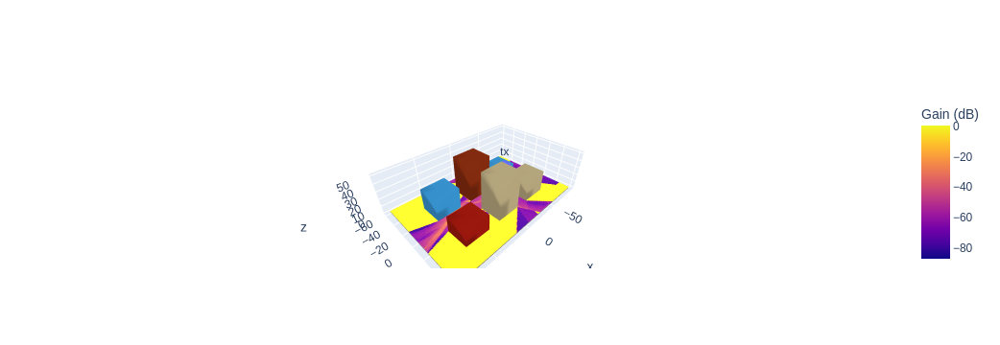

In [11]:
# Let's put one transmitter and many receivers in our scene
scene = eqx.tree_at(
    lambda s: s.transmitters, base_scene, jnp.array([-33.0, 0.0, 32.0])
)
batch = (
    200,
    200,
)  # Warning: a too large batch could easily cause OOM issues,
#    or you may want to reduce the 'chunk_size' value below.
z0 = 1.5  # The z coordinate of the receivers
scene_grid = scene.with_receivers_grid(*batch, height=1.5)
rx_grid = scene_grid.receivers
batch_size = rx_grid[..., 0].size

# And also keep track of multipath cells
cell_ids = jnp.zeros(batch, dtype=jnp.int32)  # Multipath cell indices
unique_cell_ids = jnp.empty(
    (), dtype=jnp.int32
)  # Contains unique values of 'cell_ids'
cell_hashes = {
    0: b""
}  # This is only use generate constant random color per cell
has_multipath = jnp.zeros(
    batch, dtype=bool
)  # Will be true if a receiver has at least one valid ray path

# Only need for plotting purposes
x, y, z = jnp.unstack(scene_grid.receivers, axis=-1)

ant = Dipole(2.4e9)  # 2.4 GHz
A_e = ant.aperture
E = jnp.zeros((*batch, 3))
B = jnp.zeros_like(E)

eta_r = jnp.array([
    materials[mat_name.removeprefix("mat-")].relative_permittivity(
        ant.frequency
    )
    for mat_name in scene.mesh.material_names
])
n_r = jnp.sqrt(eta_r)

def fields(paths, scene: TriangleScene, remove_duplicates: bool = False):
    E_i, B_i = ant.fields(paths.vertices[..., 1, :])

    order = paths.order

    if order > 0:
        # [*batch num_path_candidates order]
        obj_indices = paths.objects[..., 1:-1]
        # [*batch num_path_candidates order]
        mat_indices = jnp.take(
            scene.mesh.face_materials, obj_indices, axis=0
        )
        # [*batch num_path_candidates order 3]
        obj_normals = jnp.take(scene.mesh.normals, obj_indices, axis=0)
        # [*batch num_path_candidates order]
        obj_n_r = jnp.take(n_r, mat_indices, axis=0)
        # [*batch num_path_candidates order+1 3]
        path_segments = jnp.diff(paths.vertices, axis=-2)
        # [*batch num_path_candidates order+1 3],
        # [*batch num_path_candidates order+1 1]
        k, s = normalize(path_segments, keepdims=True)
        # [*batch num_path_candidates order 3]
        k_i = k[..., :-1, :]
        k_r = k[..., +1:, :]
        # [*batch num_path_candidates order 3]
        (e_i_s, e_i_p), (e_r_s, e_r_p) = sp_directions(
            k_i, k_r, obj_normals
        )
        # [*batch num_path_candidates order 1]
        cos_theta = dot(obj_normals, -k_i, keepdims=True)
        # [*batch num_path_candidates order 1]
        r_s, r_p = reflection_coefficients(
            obj_n_r[..., None], cos_theta
        )
        # [*batch num_path_candidates 1]
        r_s = jnp.prod(r_s, axis=-2)
        r_p = jnp.prod(r_p, axis=-2)
        # [*batch num_path_candidates order 3]
        (e_i_s, e_i_p), (e_r_s, e_r_p) = sp_directions(
            k_i, k_r, obj_normals
        )
        # [*batch num_path_candidates 1]
        E_i_s = dot(E_i, e_i_s[..., 0, :], keepdims=True)
        E_i_p = dot(E_i, e_i_p[..., 0, :], keepdims=True)
        B_i_s = dot(B_i, e_i_s[..., 0, :], keepdims=True)
        B_i_p = dot(B_i, e_i_p[..., 0, :], keepdims=True)
        # [*batch num_path_candidates 1]
        E_r_s = r_s * E_i_s
        E_r_p = r_p * E_i_p
        B_r_s = r_s * B_i_s
        B_r_p = r_p * B_i_p
        # [*batch num_path_candidates 3]
        E_r = E_r_s * e_r_s[..., -1, :] + E_r_p * e_r_p[..., -1, :]
        B_r = B_r_s * e_r_s[..., -1, :] + B_r_p * e_r_p[..., -1, :]
        # [*batch num_path_candidates 1]
        s_tot = s.sum(axis=-2)
        spreading_factor = (
            s[..., 0, :] / s_tot
        )  # Far-field approximation
        phase_shift = jnp.exp(1j * s_tot * ant.wavenumber)
        # [*batch num_path_candidates 3]
        E_r *= spreading_factor * phase_shift
        B_r *= spreading_factor * phase_shift
    else:
        # [*batch num_path_candidates 3]
        E_r = E_i
        B_r = B_i

    if remove_duplicates:
        assert paths.mask.ndim == 1
        num_path_candidates = paths.mask.shape[-1]
        
        _, index, counts = jnp.unique(
            obj_indices,
            axis=-2,
            size=num_path_candidates,
            return_index=True,
            return_counts=True,
        )
        mask = paths.mask[..., index] & (counts > 0)
    else:
        mask = paths.mask

    # [*batch 3]
    E = jnp.sum(E_r, axis=-2, where=mask[..., None])
    B = jnp.sum(B_r, axis=-2, where=mask[..., None])

    return E, B

@eqx.filter_jit
def fields_pred(
    rx: Array,
    model: Model,
    scene: TriangleScene,
    *,
    key: PRNGKeyArray = jax.random.key(1234),
    num_path_candidates: int = 20,
):
    # print(f"{rx.shape = }")
    s = eqx.tree_at(lambda s: s.receivers, scene, rx)
    path_candidates = model.sample_path_candidates(
        s,
        order=order,
        num_path_candidates=num_path_candidates,
        key=jax.random.key(1234),
    )
    _, index, counts = jnp.unique(
        path_candidates,
        axis=0,
        size=num_path_candidates,
        return_index=True,
        return_counts=True,
    )
    paths = s.compute_paths(path_candidates=path_candidates)
    # print(f"{paths.mask.shape = }")

    E, B = fields

    # return (paths.mask / path_lengths(paths.vertices) ** 2)[index].sum(
    #     axis=-1, where=counts > 0
    # )


models = {1: model_1, 2: model_2}

with reuse() as fig:
    scene.plot()
    E_gt = jnp.zeros((*batch, 3))
    B_gt = jnp.zeros_like(E_gt)
    E_pr = jnp.zeros_like(E_gt)
    B_pr = jnp.zeros_like(E_gt)

    for order in range(0, 3):
        # Ground truth
        for paths in scene_grid.compute_paths(order=order, chunk_size=1_000):
            E, B = fields(paths, scene)
            E_gt += E
            B_gt += B

        # Model prediction
        # note: we use scan because vmap allocates too much memory

        @scan_tqdm(batch_size)
        def body_fun(carry, index):
            i, j = divmod(index, carry[0].shape[1])

            local_scene = eqx.tree_at(lambda s: s.receivers, scene, rx_grid[i,j])
            
            path_candidates = models[order].sample_path_candidates(
                local_scene,
                order=order,
                num_path_candidates=20,
                key=jax.random.key(1234),
            )

            paths = local_scene.compute_paths(path_candidates=path_candidates)

            E, B = fields(paths, local_scene, remove_duplicates=True)
            carry = (carry[0].at[i,j].add(E), carry[1].at[i,j].add(B))

            return carry, None

        if order > 0:
            (E_pr, B_pr),_ = jax.lax.scan(
                body_fun, (E_pr, B_pr), jnp.arange(batch_size))
        else:
            E_pr += E
            B_pr += B

    S = pointing_vector(E_gt, B_gt)
    P = A_e * jnp.linalg.norm(S, axis=-1)
    L_dB = 10 * jnp.log10(P / ant.reference_power)

    draw_image(
        L_dB, x=x[0, :], y=y[:, 0], z0=z0, colorbar={"title": "Gain (dB)"}
    )

# We set cell ids with no multiple to -1 for easier identification

if not has_multipath.all():
    # Simple way to retrieve the cell index that has no multipath
    cell_id = jnp.max(cell_ids, initial=0, where=~has_multipath)
    cell_hashes[-1] = cell_hashes.pop(int(cell_id))

cell_ids = jnp.where(has_multipath, cell_ids, -1)

fig

In [12]:
tx_x, tx_y, _ = scene_grid.transmitters.reshape(3, 1)
with reuse() as fig:
    scene.plot()
    draw_image(
        np.asarray(power),
        x=np.asarray(x[0, :]),
        y=np.asarray(y[:, 0]),
        z0=z0,
    )

fig

NameError: name 'power' is not defined

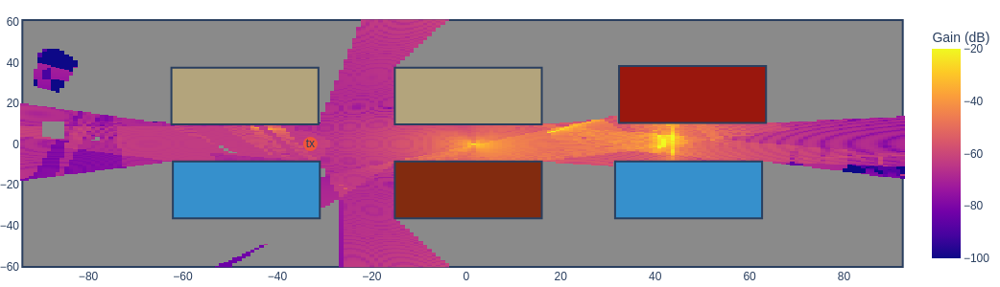

In [20]:
with reuse() as fig:
    draw_mesh_2d(scene.mesh, fig)
    S = pointing_vector(E_pr, B_pr)
    P = A_e * jnp.linalg.norm(S, axis=-1)
    L_dB = 10 * jnp.log10(P / ant.reference_power)

    fig.add_heatmap(z=L_dB,
                    zmin=-100, zmax=-20,
                    x=np.asarray(x[0, :]), colorbar={"title": "Gain (dB)"},
        y=np.asarray(y[:, 0]),)
    fig.add_scatter(
            x=tx_x,
            y=tx_y,
            mode="markers+text",
            text=["tx"],
            marker={"color": "#EF553B", "size": 15},
            showlegend=False,
    )

fig.update_layout(width=400,height=300,
                plot_bgcolor="rgba(0, 0, 0, 0)",
paper_bgcolor="rgba(0, 0, 0, 0)",
)
fig.update_layout(
    margin=dict(l=0, r=0, t=20, b=20),
)
fig.update_xaxes(showgrid=False, zeroline=False)
fig.update_yaxes(showgrid=False, zeroline=False)
fig.write_image("pred.png", scale=2)
fig

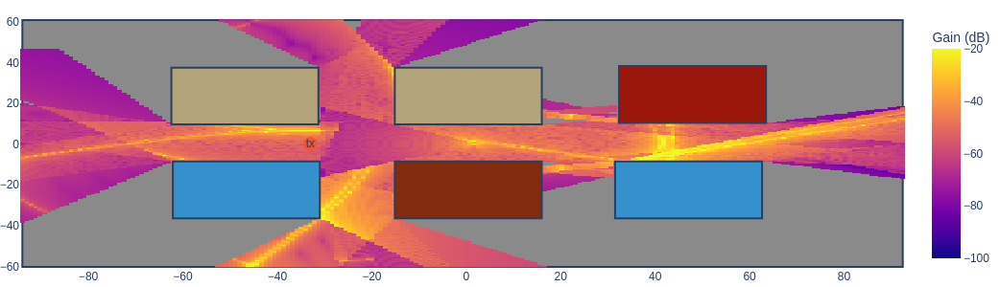

In [21]:
with reuse() as fig:
    draw_mesh_2d(scene.mesh, fig)
    S = pointing_vector(E_gt, B_gt)
    P = A_e * jnp.linalg.norm(S, axis=-1)
    L_dB = 10 * jnp.log10(P / ant.reference_power)

    fig.add_heatmap(z=L_dB,
                    zmin=-100, zmax=-20,
                    x=np.asarray(x[0, :]), colorbar={"title": "Gain (dB)"},
        y=np.asarray(y[:, 0]),)
    fig.add_scatter(
            x=tx_x,
            y=tx_y,
            mode="markers+text",
            text=["tx"],
            marker={"color": "#EF553B", "size": 15},
            showlegend=False,
    )

fig.update_layout(width=400,height=300,
                plot_bgcolor="rgba(0, 0, 0, 0)",
paper_bgcolor="rgba(0, 0, 0, 0)",
)
fig.update_layout(
    margin=dict(l=0, r=0, t=20, b=20),
)
fig.update_xaxes(showgrid=False, zeroline=False)
fig.update_yaxes(showgrid=False, zeroline=False)
fig.write_image("gt.png", scale=2)
fig

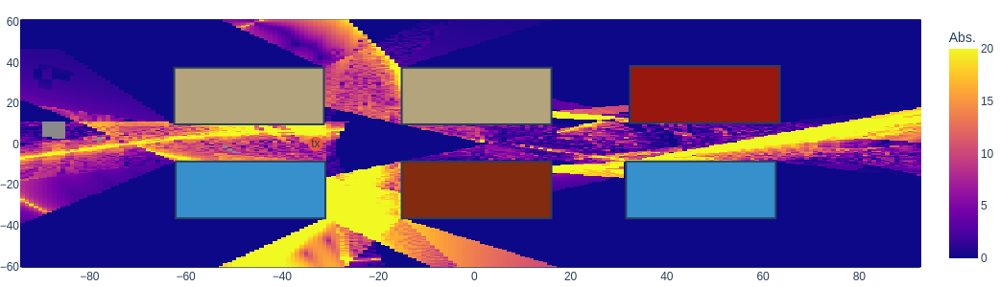

In [37]:
import matplotlib.pyplot as plt
import plotly.express as px

eps = jnp.finfo(jnp.float32).eps
#e = jnp.abs(jnp.log10(power + eps) - jnp.log10(power_s + eps))

S = pointing_vector(E_gt, B_gt)
P = A_e * jnp.linalg.norm(S, axis=-1)
Lgt_dB = 10 * jnp.log10(eps + P / ant.reference_power)
S = pointing_vector(E_pr, B_pr)
P = A_e * jnp.linalg.norm(S, axis=-1)
Lpr_dB = 10 * jnp.log10(eps + P / ant.reference_power)

e_dB = jnp.abs(Lgt_dB - Lpr_dB)

with reuse() as fig:
    draw_mesh_2d(scene.mesh, fig)
    fig.add_heatmap(z=e_dB,
                    #zmin=-100,
                    zmin=0,
                    zmax=20,
                    x=np.asarray(x[0, :]), colorbar={"title": "Abs."},
        y=np.asarray(y[:, 0]),)
    fig.add_scatter(
            x=tx_x,
            y=tx_y,
            mode="markers+text",
            text=["tx"],
            marker={"color": "#EF553B", "size": 15},
            showlegend=False,
    )
    
fig.update_layout(width=400,height=300,
                plot_bgcolor="rgba(0, 0, 0, 0)",
paper_bgcolor="rgba(0, 0, 0, 0)",
)
fig.update_layout(
    margin=dict(l=0, r=0, t=20, b=20),
)
fig.update_xaxes(showgrid=False, zeroline=False)
fig.update_yaxes(showgrid=False, zeroline=False)
fig.write_image("delta.png", scale=2)
fig

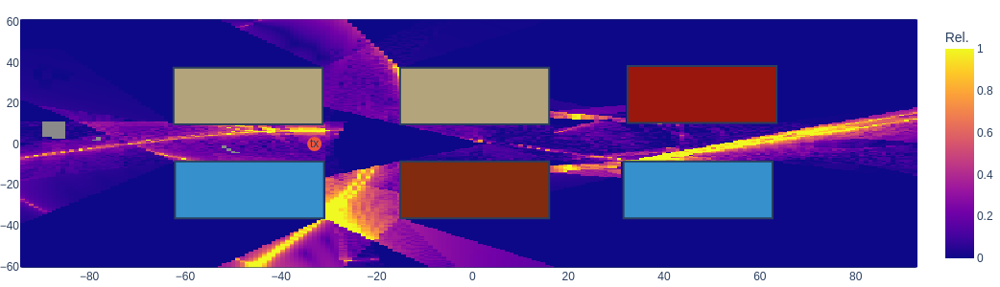

In [41]:
import matplotlib.pyplot as plt
import plotly.express as px

eps = jnp.finfo(jnp.float32).eps
er_dB = e_dB / jnp.abs(Lgt_dB)

with reuse() as fig:
    draw_mesh_2d(scene.mesh, fig)
    fig.add_heatmap(z=er_dB,
                    #zmin=-100,
                    zmin=0,
                    zmax=1,
                    x=np.asarray(x[0, :]), colorbar={"title": "Rel."},
        y=np.asarray(y[:, 0]),)
    fig.add_scatter(
            x=tx_x,
            y=tx_y,
            mode="markers+text",
            text=["tx"],
            marker={"color": "#EF553B", "size": 15},
            showlegend=False,
    )
    
fig.update_layout(width=400,height=300,
                plot_bgcolor="rgba(0, 0, 0, 0)",
paper_bgcolor="rgba(0, 0, 0, 0)",
)
fig.update_layout(
    margin=dict(l=0, r=0, t=20, b=20),
)
fig.update_xaxes(showgrid=False, zeroline=False)
fig.update_yaxes(showgrid=False, zeroline=False)
fig.write_image("delta_r.png", scale=2)
fig